In [1]:
#unità di misura delle features numeriche:
#Profondità: m
#Cpue:kg
#Diplodus, D_dentex, M_surmuletus, O_vulgaris, P_elephas, P_pagrus, S_scrofa, S_officinalis:kg
#kg_specie:kg

#Features categoriche: Fondale, Attrezzo
#Features ordinali: Settore(da 1 a 10), AMP (0 e 1)

In [2]:
import pandas as pd 
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
import seaborn as sns
import chart_studio.plotly as py
import plotly.graph_objects as go
from chart_studio import tools
import plotly.express as px

pd.set_option('display.max_columns', 50)

In [3]:
#Estrazione file
file = 'Dati_2013-2016.csv'
data = pd.read_csv(file, sep=';', encoding='latin-1')

In [4]:
#Raw dataset prime 5 righe
data.head(2)

,Scheda,Data,Mese,Anno,Barca,Zona,Settore,AMP,Profondità,Fondale,Attrezzo,Cpue,Diplodus,D_dentex,M_surmuletus,O_vulgaris,P_elephas,P_pagrus,S_scrofa,S_officinalis,kg_specie
0,007AMP16,13/03/2016,3,2016,SPARVIERO DEL MARE,ZONA PORTO,2,1,50.0,MISTO,TRAMAGLIO,15.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
1,152AMP16,19/03/2016,3,2016,ETTORE,CAVOLI OVEST,3,1,20.0,MISTO,TRAMAGLIO,6.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0


In [5]:
#Copia dataset
df = data.copy()

In [6]:
#Dimensione dataset (#righe, #colonne)
df.shape

(647, 21)

In [7]:
#Valori non nulli e tipo di dati 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 647 entries, 0 to 646
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Scheda         647 non-null    object 
 1   Data           647 non-null    object 
 2   Mese           647 non-null    int64  
 3   Anno           647 non-null    int64  
 4   Barca          647 non-null    object 
 5   Zona           647 non-null    object 
 6   Settore        647 non-null    int64  
 7   AMP            647 non-null    int64  
 8   Profondità     640 non-null    float64
 9   Fondale        647 non-null    object 
 10  Attrezzo       647 non-null    object 
 11  Cpue           647 non-null    float64
 12  Diplodus       194 non-null    float64
 13  D_dentex       87 non-null     float64
 14  M_surmuletus   100 non-null    float64
 15  O_vulgaris     168 non-null    float64
 16  P_elephas      99 non-null     float64
 17  P_pagrus       106 non-null    object 
 18  S_scrofa  

In [8]:
# Valori statistici di tutte le variabili numeriche 
# N.B. In questi valori statistici non vengono considerati i valori NaN 
# Ex: NON vengono considerare le volte in cui non si è pescata quella determinata specie
df.describe()

,Mese,Anno,Settore,AMP,Profondità,Cpue,Diplodus,D_dentex,M_surmuletus,O_vulgaris,P_elephas,S_scrofa,S_officinalis,kg_specie
count,647.000000,647.000000,647.000000,647.000000,640.000000,647.000000,194.000000,87.000000,100.000000,168.000000,99.000000,373.000000,259.000000,647.000000
mean,6.539413,2015.032457,5.573416,0.751159,40.910938,20.689734,1.980335,3.642437,2.373000,31.259292,3.978283,3.978997,3.601629,14.441413
std,2.912221,1.358563,3.188666,0.432676,21.757805,19.784550,2.001667,3.982179,3.694836,29.851322,3.156085,3.984952,3.645390,19.145714
min,1.000000,2013.000000,1.000000,0.000000,10.000000,0.200000,0.100000,0.300000,0.050000,0.100000,0.100000,0.100000,0.100000,0.000000
25%,4.000000,2013.000000,3.000000,1.000000,27.750000,8.000000,0.600000,1.000000,0.500000,2.500000,2.000000,1.500000,1.000000,4.000000
50%,6.000000,2016.000000,4.000000,1.000000,35.000000,14.000000,1.205000,2.000000,1.100000,25.000000,3.000000,2.800000,2.000000,7.100000
75%,9.000000,2016.000000,8.000000,1.000000,50.000000,25.000000,2.500000,5.000000,3.000000,50.000000,5.000000,5.000000,5.000000,15.500000
max,12.000000,2017.000000,10.000000,1.000000,200.000000,120.000000,10.000000,25.000000,25.000000,120.000000,20.000000,23.400000,20.000000,120.000000


In [9]:
#Conta dei valori presenti
df['AMP'].value_counts()

1    486
0    161
Name: AMP, dtype: int64

In [10]:
#Conta dei valori presenti
df['Settore'].value_counts()

3     190
10    133
8     102
2      79
6      37
1      32
9      28
4      26
7      11
5       9
Name: Settore, dtype: int64

In [11]:
#Conta dei valori presenti
df['Fondale'].value_counts()

MISTO         552
SABBIA         61
ROCCIA         32
P.OCEANICA      2
Name: Fondale, dtype: int64

In [12]:
#Conta dei valori presenti
df['Attrezzo'].value_counts()

TRAMAGLIO    487
NASSE        116
PALAMITO      44
Name: Attrezzo, dtype: int64

In [13]:
#Colonne di interesse per alcuni grafici
columns = ['Profondità', 'Cpue', 'Fondale', 'Attrezzo', 'Settore']

In [14]:
#Dataset che considera solo le colonne specificate sopra
selected_df = df[columns]

In [15]:
#Conta dei valori NaN
selected_df.isnull().sum()

Profondità    7
Cpue          0
Fondale       0
Attrezzo      0
Settore       0
dtype: int64

In [16]:
#Correzione valori della colonna settore (era presente una F al posto di 10)
selected_df['Settore'] = selected_df['Settore'].apply(lambda x : 10 if x=='F' else x)
selected_df['Settore'] = selected_df['Settore'].astype(int)

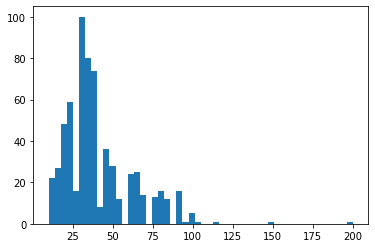

In [17]:
#Istogramma sui valori di profondità
plt.hist(selected_df.Profondità, bins=50)
plt.show()

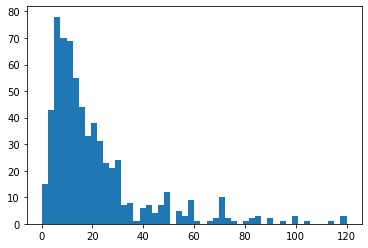

In [18]:
#Istogramma sui valori di Cpue
plt.hist(selected_df.Cpue, bins=50)
plt.show()

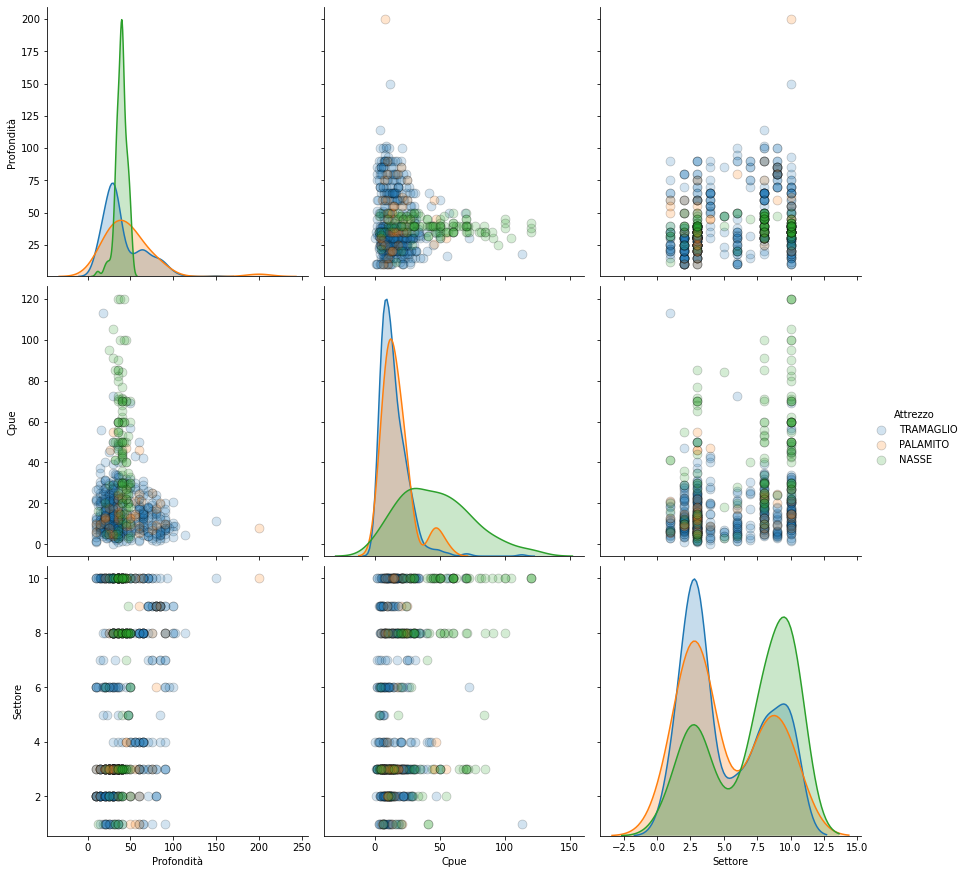

In [19]:
#Pair plot tra profondità, Cpue e Settore. I colori indicano gli atrezzi utilizzati.
#N.B nella diagonale sono presenti gli istogrammi.
sns.pairplot(selected_df, hue='Attrezzo', plot_kws={'alpha': 0.2, 's': 80, 'edgecolor': 'k'},
                   size=4)

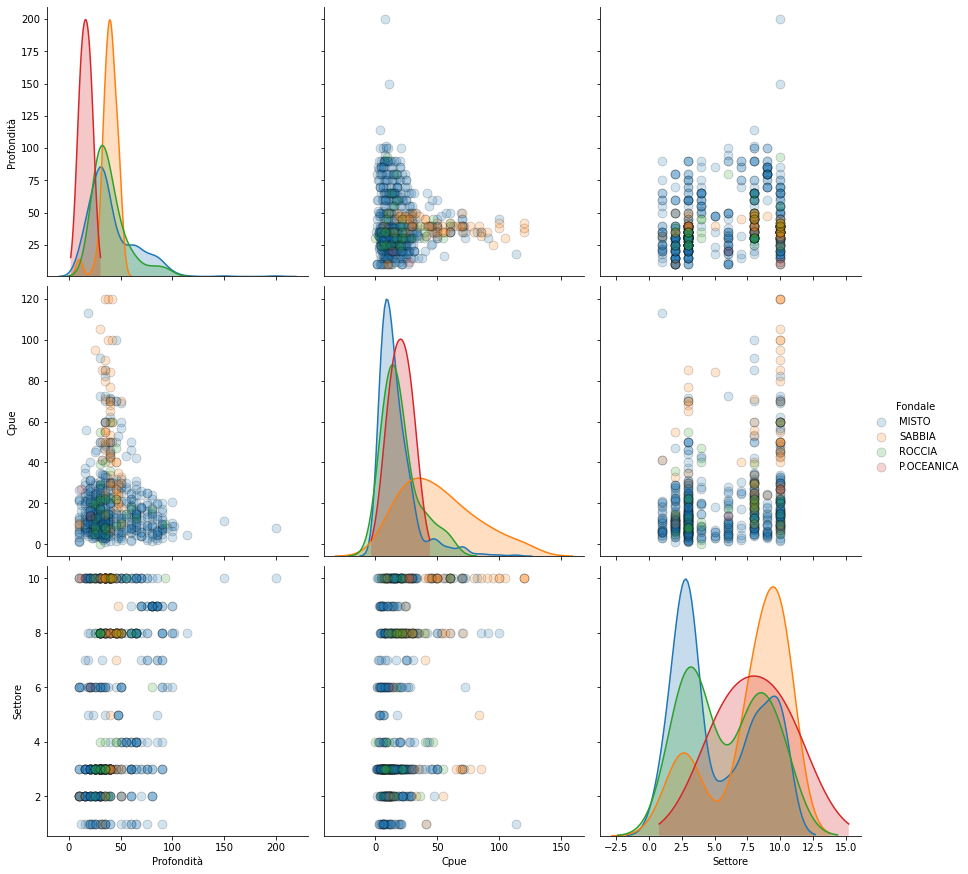

In [20]:
#Pair plot tra profondità, Cpue e Settore. I colori indicano il tipo di fondale utilizzati.
#N.B nella diagonale sono presenti gli istogrammi.
sns.pairplot(selected_df, hue='Fondale', plot_kws={'alpha': 0.2, 's': 80, 'edgecolor': 'k'},
             size=4)

Text(0, 0.5, 'Cpue (kg)')

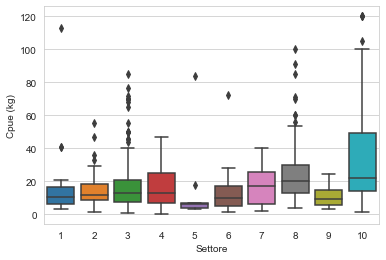

In [21]:
#Boxplot 
sns.set_style(style="whitegrid")
sns.boxplot(x='Settore', y='Cpue', data=selected_df)
plt.ylabel('Cpue (kg)')

Text(0, 0.5, 'Profondità (m)')

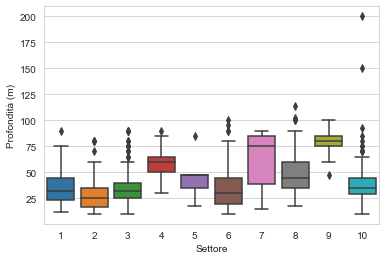

In [22]:
#Boxplot
sns.set_style(style="whitegrid")
sns.boxplot(x='Settore', y='Profondità', data=selected_df)
plt.ylabel('Profondità (m)')

Text(0, 0.5, 'Cpue (Kg)')

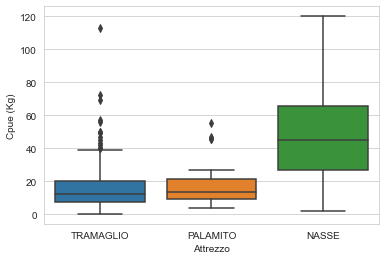

In [23]:
#Boxplot
sns.set_style(style="whitegrid")
sns.boxplot(x='Attrezzo', y='Cpue', data=selected_df)
plt.ylabel('Cpue (Kg)')

Text(0, 0.5, 'Cpue (Kg)')

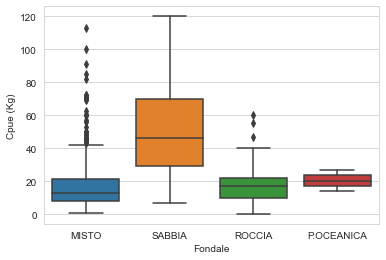

In [24]:
#Boxplot
sns.set_style(style="whitegrid")
sns.boxplot(x='Fondale', y='Cpue', data=selected_df)
plt.ylabel('Cpue (Kg)')

In [25]:
"""
plt.subplot(3,1,1)
sns.violinplot(x='Fondale', y='Cpue', data=selected_df)
plt.subplot(3,1,2)
sns.violinplot(x='Attrezzo', y='Cpue', data=selected_df)
plt.subplot(3,1,3)
sns.violinplot(x='Settore', y='Cpue', data=selected_df)
plt.tight_layout()
"""

"\nplt.subplot(3,1,1)\nsns.violinplot(x='Fondale', y='Cpue', data=selected_df)\nplt.subplot(3,1,2)\nsns.violinplot(x='Attrezzo', y='Cpue', data=selected_df)\nplt.subplot(3,1,3)\nsns.violinplot(x='Settore', y='Cpue', data=selected_df)\nplt.tight_layout()\n"

In [26]:
#Matrice di correlazione (delle colonne con valore numerico)
selected_df.corr()

,Profondità,Cpue,Settore
Profondità,1.000000,-0.086892,0.255950
Cpue,-0.086892,1.000000,0.285613
Settore,0.255950,0.285613,1.000000


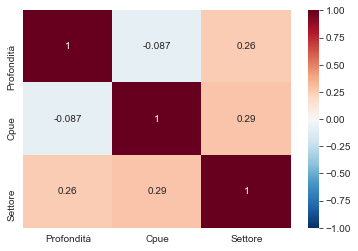

In [27]:
#Matrice di correlazione graficata
sns.heatmap(selected_df.corr(), annot=True, cmap='RdBu_r', vmin=-1, vmax=1)

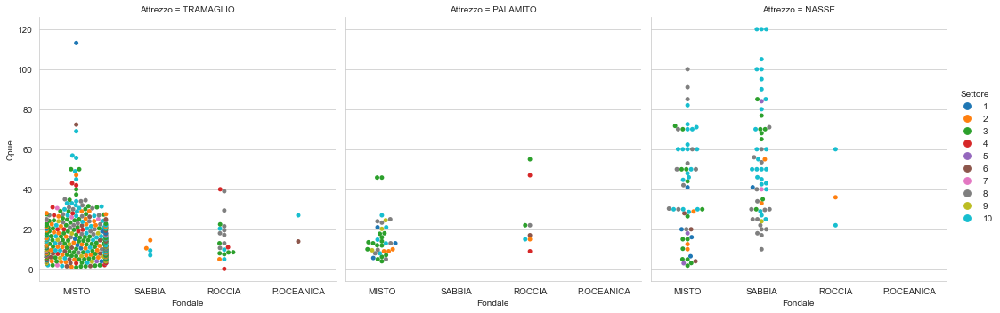

In [28]:
sns.catplot(x='Fondale', y='Cpue', hue='Settore', col='Attrezzo', data=selected_df,  kind="swarm")

In [29]:
"""
cpue_settore = selected_df.groupby(['Attrezzo','Settore']).agg(cpue_target =('Cpue','sum'))
cpue_settore.plot(kind='pie', x='Settore', y='cpue_target', title = '_', autopct="%.1f%%", figsize = (20,18));
plt.legend( loc ="center left", bbox_to_anchor =(1, 0, 0.5, 1))
"""

'\ncpue_settore = selected_df.groupby([\'Attrezzo\',\'Settore\']).agg(cpue_target =(\'Cpue\',\'sum\'))\ncpue_settore.plot(kind=\'pie\', x=\'Settore\', y=\'cpue_target\', title = \'_\', autopct="%.1f%%", figsize = (20,18));\nplt.legend( loc ="center left", bbox_to_anchor =(1, 0, 0.5, 1))\n'

In [30]:
"""
cpue_settore = selected_df.groupby(['Attrezzo','Fondale']).agg(cpue_target =('Cpue','sum'))
cpue_settore.plot(kind='pie', x='Fondale', y='cpue_target', title = '_', autopct="%.1f%%", figsize = (20,18));
plt.legend( loc ="center left", bbox_to_anchor =(1, 0, 0.5, 1))
"""

'\ncpue_settore = selected_df.groupby([\'Attrezzo\',\'Fondale\']).agg(cpue_target =(\'Cpue\',\'sum\'))\ncpue_settore.plot(kind=\'pie\', x=\'Fondale\', y=\'cpue_target\', title = \'_\', autopct="%.1f%%", figsize = (20,18));\nplt.legend( loc ="center left", bbox_to_anchor =(1, 0, 0.5, 1))\n'

In [31]:
# Pie Chart con percentuale delle volte che si sono utilizzati gli attezzi
count_attr = selected_df.groupby(['Attrezzo']).agg(attr_count=('Attrezzo', 'count'))
count_attr = count_attr.reset_index()

fig = px.sunburst(count_attr, path=['Attrezzo'], values='attr_count', title='Distribuzione degli attrezzi utilizzati')
fig.update_traces(selector=dict(type='sunburst'),texttemplate = ('%{label}<br>%{percentRoot:.2%}')) 
fig.update_layout(title_x=0.5)
fig.show('notebook')

In [32]:
# Pie Chart con percentuale dei fondali in cui si è pescato
count_fond = selected_df.groupby(['Fondale']).agg(fon_count=('Fondale', 'count'))
count_fond = count_fond.reset_index()

fig = px.sunburst(count_fond, path=['Fondale'], values='fon_count', title='Distribuzione dei fondali')
fig.update_traces(selector=dict(type='sunburst'),texttemplate = ('%{label}<br>%{percentRoot:.2%}')) 
fig.update_layout(title_x=0.5)
fig.show('notebook')

In [33]:
# Pie Chart con percentuale dei settori in cui si è pescato
count_sett = selected_df.groupby(['Settore']).agg(set_count=('Settore', 'count'))
count_sett = count_sett.reset_index()

fig = px.sunburst(count_sett, path=['Settore'], values='set_count', title='Distribuzione di ogni zona')
fig.update_traces(selector=dict(type='sunburst'),texttemplate = ('%{label}<br>%{percentRoot:.2%}')) 
fig.update_layout(title_x=0.5)
fig.show('notebook')

In [34]:
#Pie Chart con la percentuale di pesce pescato rispetto all'attrezzo e al settore
cpue_attr_sett = selected_df.groupby(['Attrezzo', 'Settore']).agg(cpue_sum=('Cpue', 'sum'))
cpue_attr_sett = cpue_attr_sett.reset_index()

fig = px.sunburst(cpue_attr_sett, path=['Attrezzo', 'Settore'], values='cpue_sum', title='Percetuale tot di pescato per ogni attrezzo e zona')
fig.update_traces(selector=dict(type='sunburst'),texttemplate = ('%{label}<br>%{percentRoot:.2%}')) 
fig.update_layout(title_x=0.5)
fig.show('notebook')

In [35]:
#Pie Chart con la percentuale di pesce pescato rispetto all'attrezzo e al fondale
cpue_attr_fon = selected_df.groupby(['Attrezzo', 'Fondale']).agg(cpue_sum=('Cpue', 'sum'))
cpue_attr_fon = cpue_attr_fon.reset_index()

fig = px.sunburst(cpue_attr_fon, path=['Attrezzo', 'Fondale'], values='cpue_sum', title='Percentuale tot di pescato per ogni atrezzo e fondale')
fig.update_traces(selector=dict(type='sunburst'),texttemplate = ('%{label}<br>%{percentRoot:.2%}')) 
fig.update_layout(title_x=0.5)
fig.show('notebook')

In [36]:
#Nuovo dataset che considera anche le specie 
columns = ['Anno','Profondità', 'Cpue', 'Fondale', 'Attrezzo', 'Settore', 'Diplodus ', 'D_dentex', 'M_surmuletus', 'O_vulgaris', 'P_elephas', 'P_pagrus', 'S_scrofa', 'S_officinalis', 'kg_specie']
specie_df = df[columns]

In [37]:
#Conta dei valori nulli presenti
specie_df.isnull().sum()

Anno               0
Profondità         7
Cpue               0
Fondale            0
Attrezzo           0
Settore            0
Diplodus         453
D_dentex         560
M_surmuletus     547
O_vulgaris       479
P_elephas        548
P_pagrus         541
S_scrofa         274
S_officinalis    388
kg_specie          0
dtype: int64

In [38]:
#Per ogni colonna delle scecie sostituzione dei valori nan con 0 che corrisponde a 0kg pescati
columns_specie = ['Diplodus ', 'D_dentex', 'M_surmuletus', 'O_vulgaris', 'P_elephas', 'P_pagrus', 'S_scrofa', 'S_officinalis']
specie_df[columns_specie] = specie_df[columns_specie].replace(to_replace=np.nan, value=0)
#Correzione valori della colonna 'P_pagrus' (era presente una N al posto NaN)
specie_df['P_pagrus'] = specie_df['P_pagrus'].apply(lambda x : 0 if x=='N' else x)
specie_df['P_pagrus'] = specie_df['P_pagrus'].astype(float)
specie_df[columns_specie].sum()

Diplodus          384.185
D_dentex          316.892
M_surmuletus      237.300
O_vulgaris       5251.561
P_elephas         393.850
P_pagrus          342.818
S_scrofa         1484.166
S_officinalis     932.822
dtype: float64

In [39]:
#Definizione funzione per la creazione dei grafici(barplot)
def plot_fig(data, columns_specie, x_ax):
    fig = plt.figure(figsize=(15,15))
    fig.subplots_adjust(hspace=0.3, wspace=0.2)
    for i in range(0, len(columns_specie)):
        plt.subplot(4, 2, i+1)
        sns.barplot(x=x_ax, y=columns_specie[i], data=data)
        plt.ylabel(columns_specie[i]+' (Kg)')
        #plt.ylim([0, 5000])

In [40]:
#N.B Fai attenzione ai valori nell'asse y, non sono impostati sulla stessa scala 
#per renderti più semplice la lettura del grafico

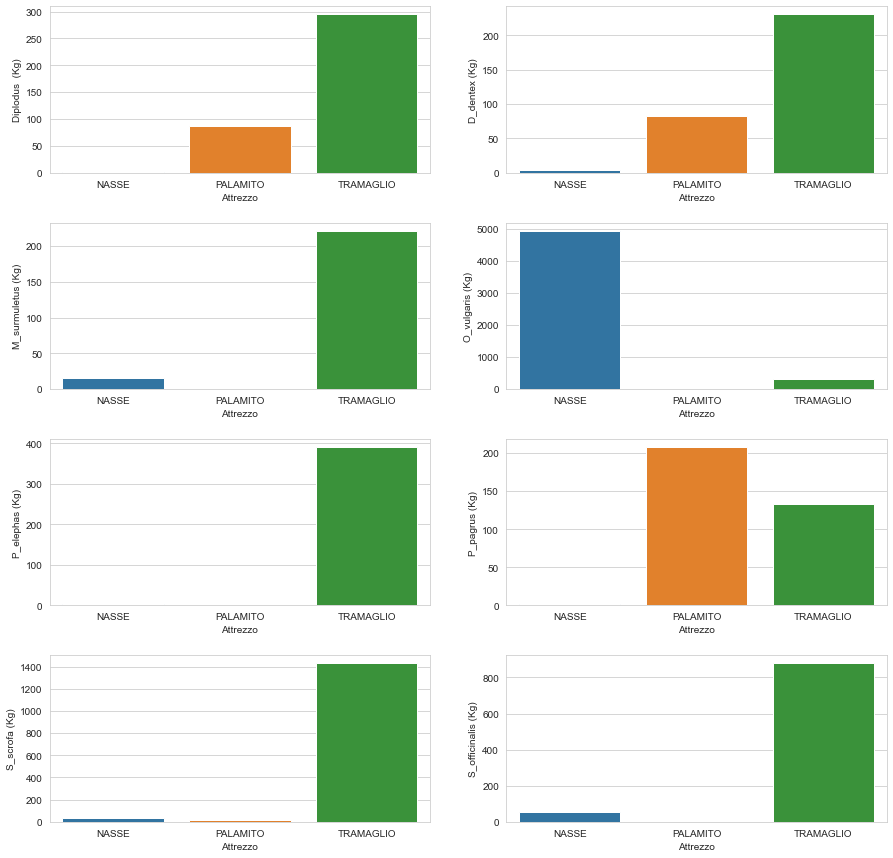

In [41]:
#Barplot per ogni specie con il totale dei kg pescati in base all'attrezzo
kgspec_attr = specie_df.groupby(['Attrezzo']).sum()
kgspec_attr = kgspec_attr.reset_index()
plot_fig(kgspec_attr, columns_specie, "Attrezzo")

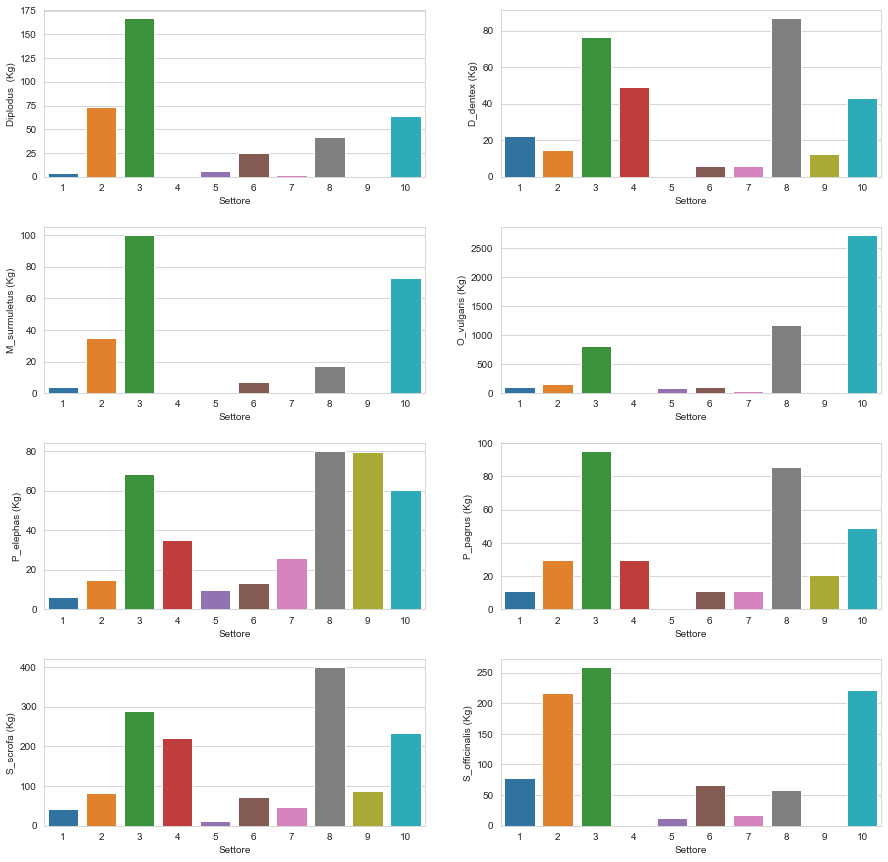

In [42]:
#Barplot per ogni specie con il totale dei kg pescati in base al settore
kgspec_sett = specie_df.groupby(['Settore']).sum()
kgspec_sett  = kgspec_sett .reset_index()
plot_fig(kgspec_sett , columns_specie, "Settore")

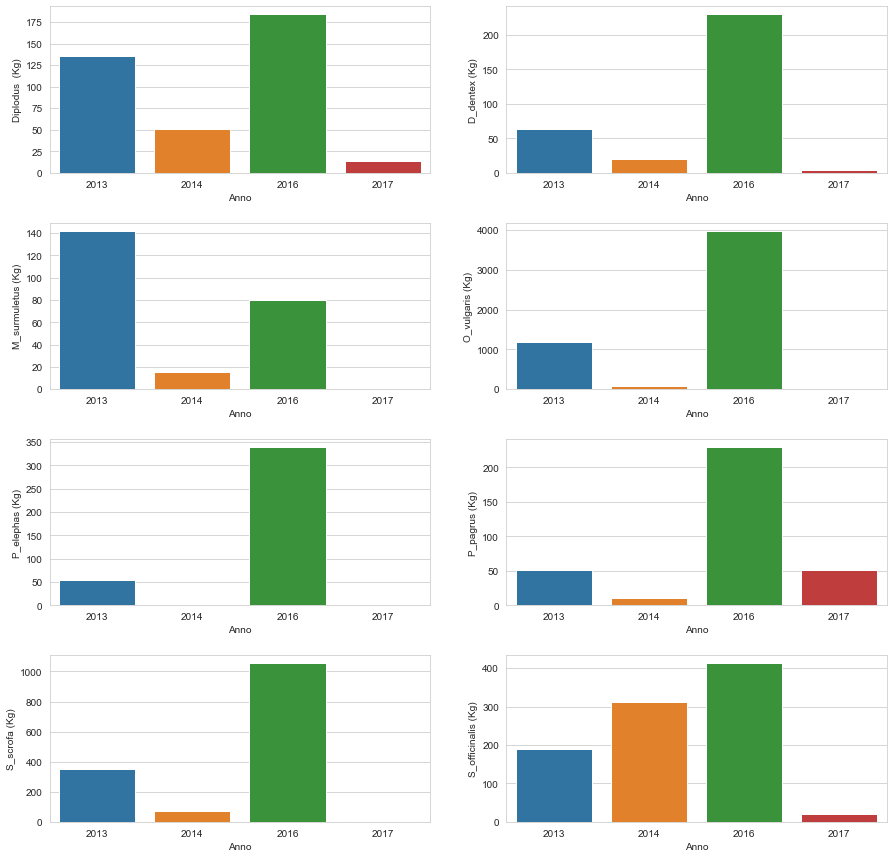

In [43]:
#Barplot per ogni specie con il totale dei kg pescati per anno
kgspec_ann = specie_df.groupby(['Anno']).sum()
kgspec_ann = kgspec_ann.reset_index()
plot_fig(kgspec_ann, columns_specie, "Anno")

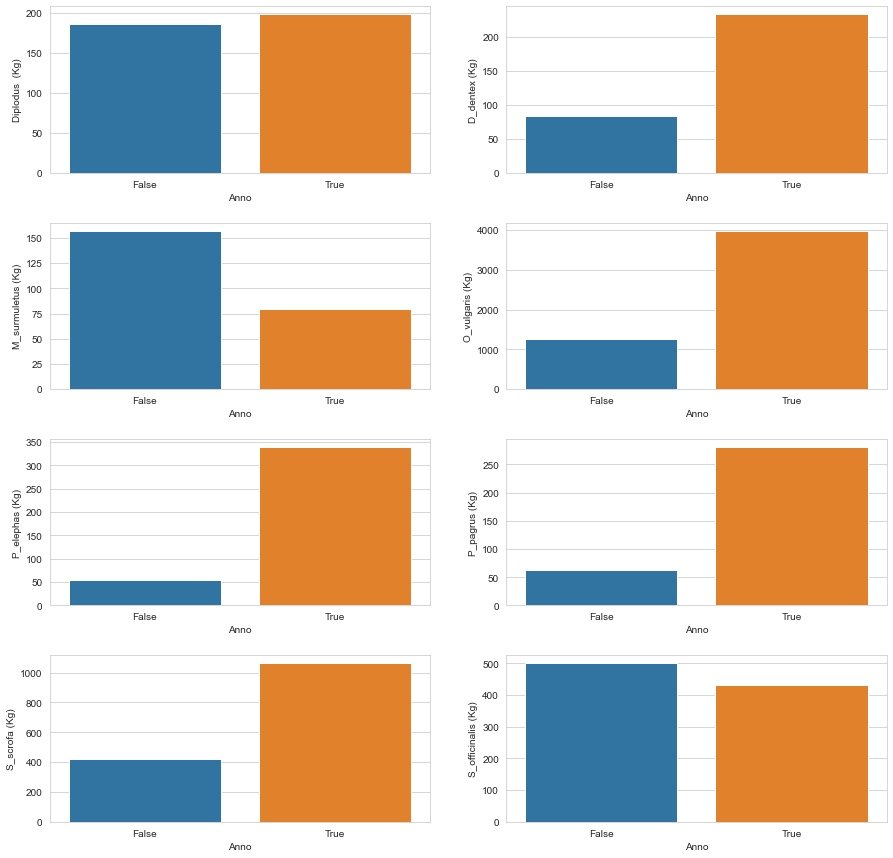

In [44]:
#Barplot per ogni specie con il totale dei kg pescati per campagna
#N.B False=2013/2014, True=2016/2017
cpue_specie_anno = specie_df.groupby(specie_df['Anno']>=2016).sum()
cpue_specie_anno = cpue_specie_anno.drop(['Anno'],axis=1)
cpue_specie_anno = cpue_specie_anno.reset_index()
plot_fig(cpue_specie_anno, columns_specie, "Anno")

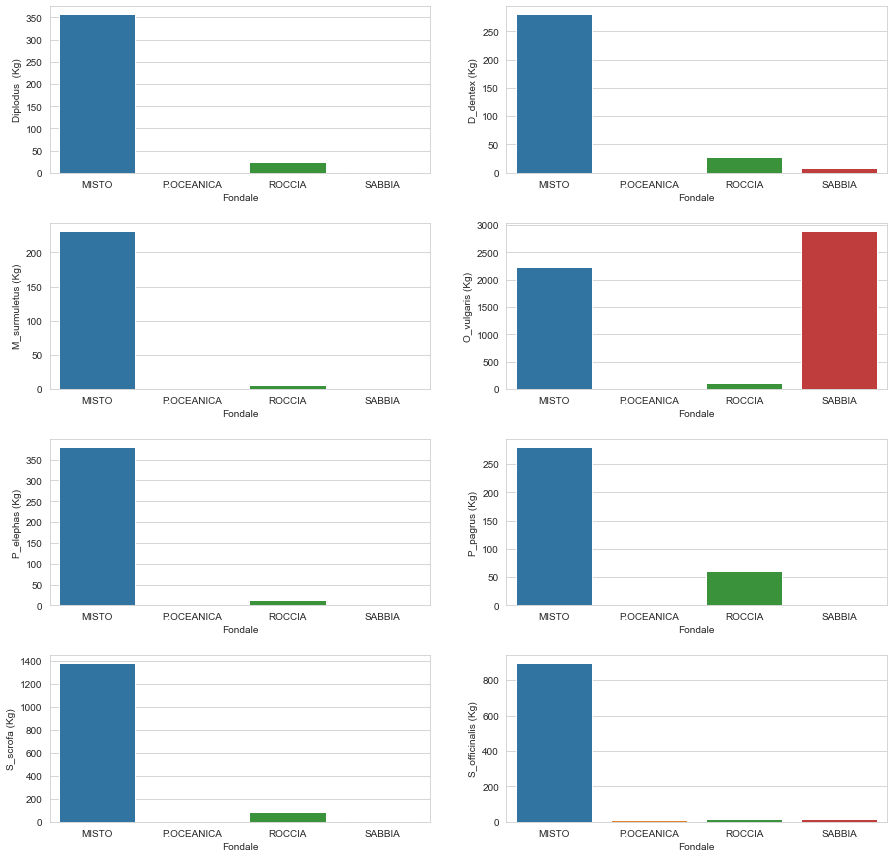

In [45]:
#Barplot per ogni specie con il totale dei kg pescati per tipo di fondale
cpue_specie_fon = specie_df.groupby(['Fondale']).sum()
cpue_specie_fon = cpue_specie_fon.reset_index()
plot_fig(cpue_specie_fon, columns_specie, "Fondale")

In [46]:
#Nei grafici che seguiranno nella x sono presenti i kg della specie considerata e nelle y è presente la profondità mentre nelle x i chili della specie considerata

Text(0, 0.5, 'Diplodus  (Kg)')

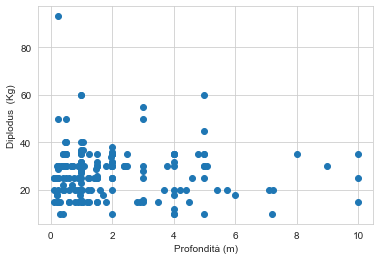

In [47]:
d = specie_df[specie_df['Diplodus '] != 0]
plt.scatter(d['Diplodus '], d['Profondità'])
plt.xlabel('Profondità'+' (m)')
plt.ylabel('Diplodus '+' (Kg)')

Text(0, 0.5, 'D_dentex (Kg)')

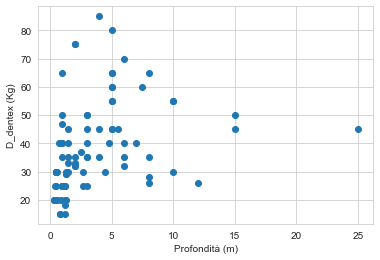

In [48]:
d = specie_df[specie_df['D_dentex'] != 0]
plt.scatter(d['D_dentex'], d['Profondità'])
plt.xlabel('Profondità'+' (m)')
plt.ylabel('D_dentex'+' (Kg)')

Text(0, 0.5, 'M_surmuletus (Kg)')

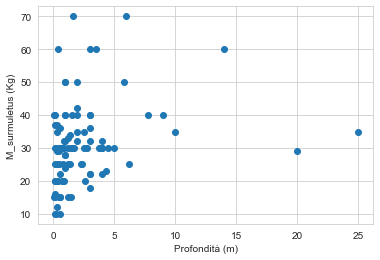

In [49]:
d = specie_df[specie_df['M_surmuletus'] != 0]
plt.scatter(d['M_surmuletus'], d['Profondità'])
plt.xlabel('Profondità'+' (m)')
plt.ylabel('M_surmuletus'+' (Kg)')

Text(0, 0.5, 'O_vulgaris (Kg)')

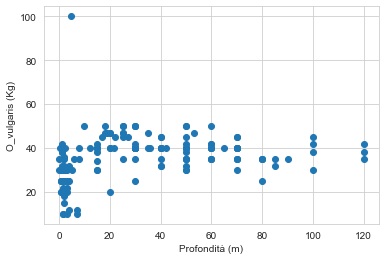

In [50]:
d = specie_df[specie_df['O_vulgaris'] != 0]
plt.scatter(d['O_vulgaris'], d['Profondità'])
plt.xlabel('Profondità'+' (m)')
plt.ylabel('O_vulgaris'+' (Kg)')

Text(0, 0.5, 'P_elephas (Kg)')

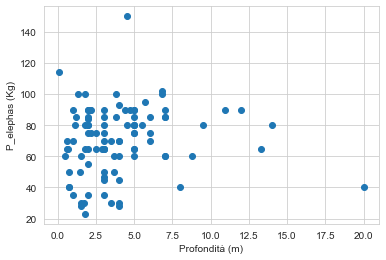

In [51]:
d = specie_df[specie_df['P_elephas'] != 0]
plt.scatter(d['P_elephas'], d['Profondità'])
plt.xlabel('Profondità'+' (m)')
plt.ylabel('P_elephas'+' (Kg)')

Text(0, 0.5, 'P_pagrus (Kg)')

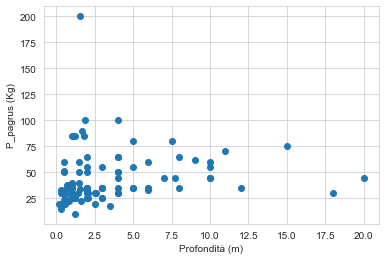

In [52]:
d = specie_df[specie_df['P_pagrus'] != 0]
plt.scatter(d['P_pagrus'], d['Profondità'])
plt.xlabel('Profondità'+' (m)')
plt.ylabel('P_pagrus'+' (Kg)')

Text(0, 0.5, 'S_scrofa (Kg)')

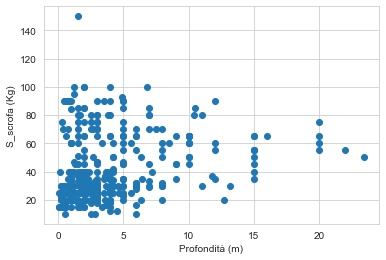

In [53]:
d = specie_df[specie_df['S_scrofa'] != 0]
plt.scatter(d['S_scrofa'], d['Profondità'])
plt.xlabel('Profondità'+' (m)')
plt.ylabel('S_scrofa'+' (Kg)')

Text(0, 0.5, 'S_officinalis (Kg)')

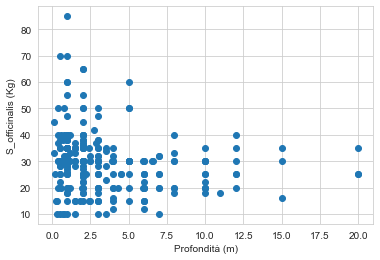

In [54]:
d = specie_df[specie_df["S_officinalis"] != 0]
plt.scatter(d["S_officinalis"], d['Profondità'])
plt.xlabel('Profondità'+' (m)')
plt.ylabel('S_officinalis'+' (Kg)')

In [55]:
kgspec_sett = specie_df.groupby(['Settore'])['O_vulgaris'].mean()
kgspec_sett 

Settore
1      3.213188
2      2.084101
3      4.257521
4      0.000000
5      9.777778
6      2.881081
7      3.818182
8     11.591392
9      0.678571
10    20.580782
Name: O_vulgaris, dtype: float64

In [56]:
# Valori statistici di tutte le variabili numeriche 
# N.B. Rispetto alla tabella precedente questi valori sono stati ottenuti dopo aver sostituito 
# IN TUTTE LE SPECIE i valori NaN con il valore zero (0kg)
# Ex: vengono considerate le volte in cui non si è pescata quella determinata specie

specie_df.describe()

,Anno,Profondità,Cpue,Settore,Diplodus,D_dentex,M_surmuletus,O_vulgaris,P_elephas,P_pagrus,S_scrofa,S_officinalis,kg_specie
count,647.000000,640.000000,647.000000,647.000000,647.000000,647.000000,647.000000,647.000000,647.000000,647.000000,647.000000,647.000000,647.000000
mean,2015.032457,40.910938,20.689734,5.573416,0.593794,0.489787,0.366770,8.116787,0.608733,0.529858,2.293920,1.441765,14.441413
std,1.358563,21.757805,19.784550,3.188666,1.421842,1.912488,1.681997,20.457167,1.888233,1.919515,3.607748,2.902784,19.145714
min,2013.000000,10.000000,0.200000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2013.000000,27.750000,8.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000
50%,2016.000000,35.000000,14.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,7.100000
75%,2016.000000,50.000000,25.000000,8.000000,0.400000,0.000000,0.000000,0.622000,0.000000,0.000000,3.000000,2.000000,15.500000
max,2017.000000,200.000000,120.000000,10.000000,10.000000,25.000000,25.000000,120.000000,20.000000,20.000000,23.400000,20.000000,120.000000
